In [ ]:
suppressPackageStartupMessages({
    library(reticulate)
    library(ggplot2)
    library(data.table)
    library(Seurat)
    library(dplyr)
    library(tidyr)
    library(tibble)
    library(stringr)
    library(Matrix)
    library(dittoSeq)
    library(future)
    plan("multiprocess", workers = 8)
    options(future.globals.maxSize = 1000 * 1024^5)
    options(stringsAsFactors = FALSE)
    set.seed(123)
})

### Extract data from anndata object and input to Seurat

In [ ]:
use_condaenv("scarches")
sc <- import("scanpy")

In [ ]:
gbm_latent <- sc$read_h5ad("data/latent_extended_GBmap.h5ad")

In [ ]:
adata <- sc$read_h5ad("data/extended_GBmap.h5ad")

In [ ]:
counts <- t(adata$layers["counts"])
colnames(counts) <- adata$obs_names$to_list()
rownames(counts) <- adata$var_names$to_list()
counts <- as(counts, "CsparseMatrix")

data <- t(adata$X)
colnames(data) <- adata$obs_names$to_list()
rownames(data) <- adata$var_names$to_list()
data <- as(data, "CsparseMatrix")

### Create the Seurat object

In [ ]:
gbm <- CreateSeuratObject(counts)
gbm <- SetAssayData(gbm, "data", data)
gbm <- AddMetaData(gbm, adata$obs)

### Import dim. reductions

In [ ]:
# set embeddings
embedding <- gbm_latent$obsm["X_umap"]
rownames(embedding) <- adata$obs_names$to_list() # obs_names from gbm_latent does not have cellIDs (only indexes)
colnames(embedding) <- c("umap_1", "umap_2")
gbm[["umap"]] <- CreateDimReducObject(embedding, key = "umap_")

# set UMAP models
umap.new.model <- list()
umap.new.model$n_epochs <- 500
umap.new.model$alpha <-1
umap.new.model$method <- "umap"
umap.new.model$negative_sample_rate <- 5
umap.new.model$gamma <- 1
umap.new.model$approx_pow <- 0
umap.new.model$metric$cosine <- list()
umap.new.model$embedding <- gbm[["umap"]]@cell.embeddings
ab_param <- uwot:::find_ab_params(spread = 1, min_dist = 0.3)
umap.new.model$a <- ab_param["a"]
umap.new.model$b <- ab_param["b"]
gbm[["umap"]]@misc$model <- umap.new.model

Warning message:
“No assay specified, setting assay as RNA by default.”


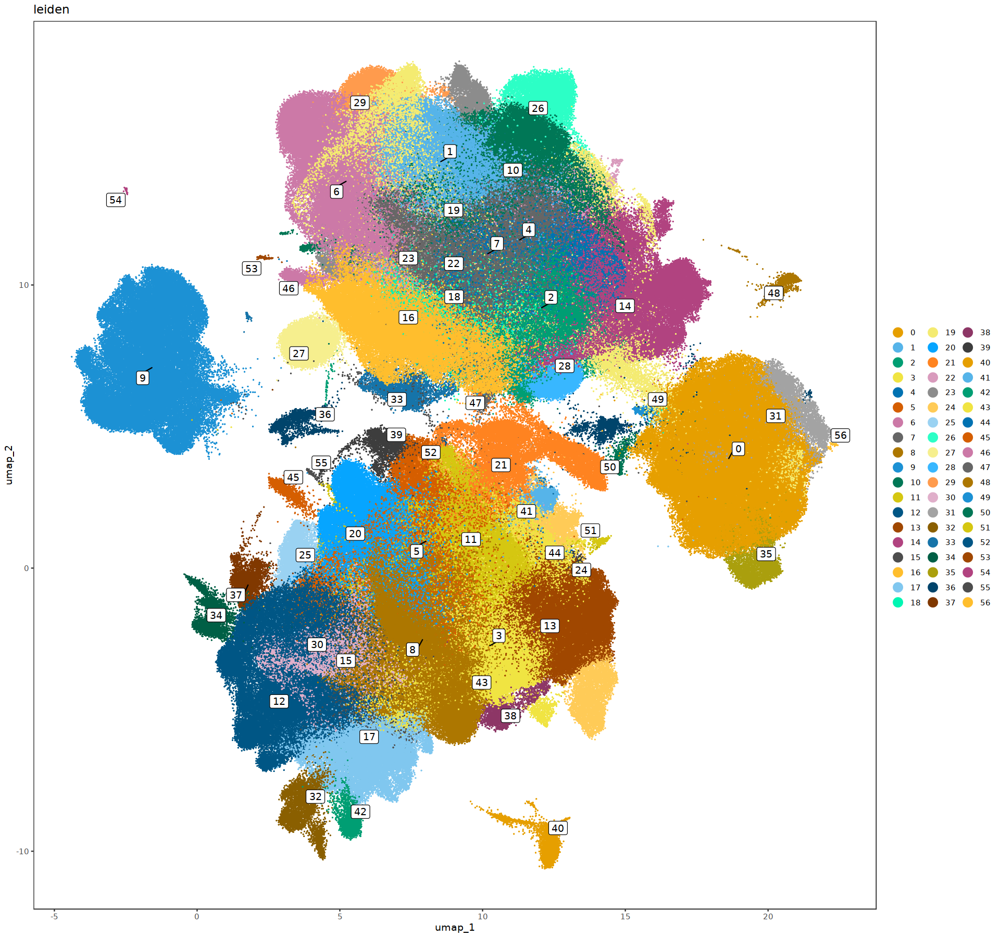

In [ ]:
options(repr.plot.height = 15, repr.plot.width = 16)
dittoDimPlot(gbm, do.raster = TRUE, size = 0.5,
             reduction.use = "umap", var = "leiden", 
                       do.label = T, labels.size = 4)

Warning message:
“ggrepel: 22 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


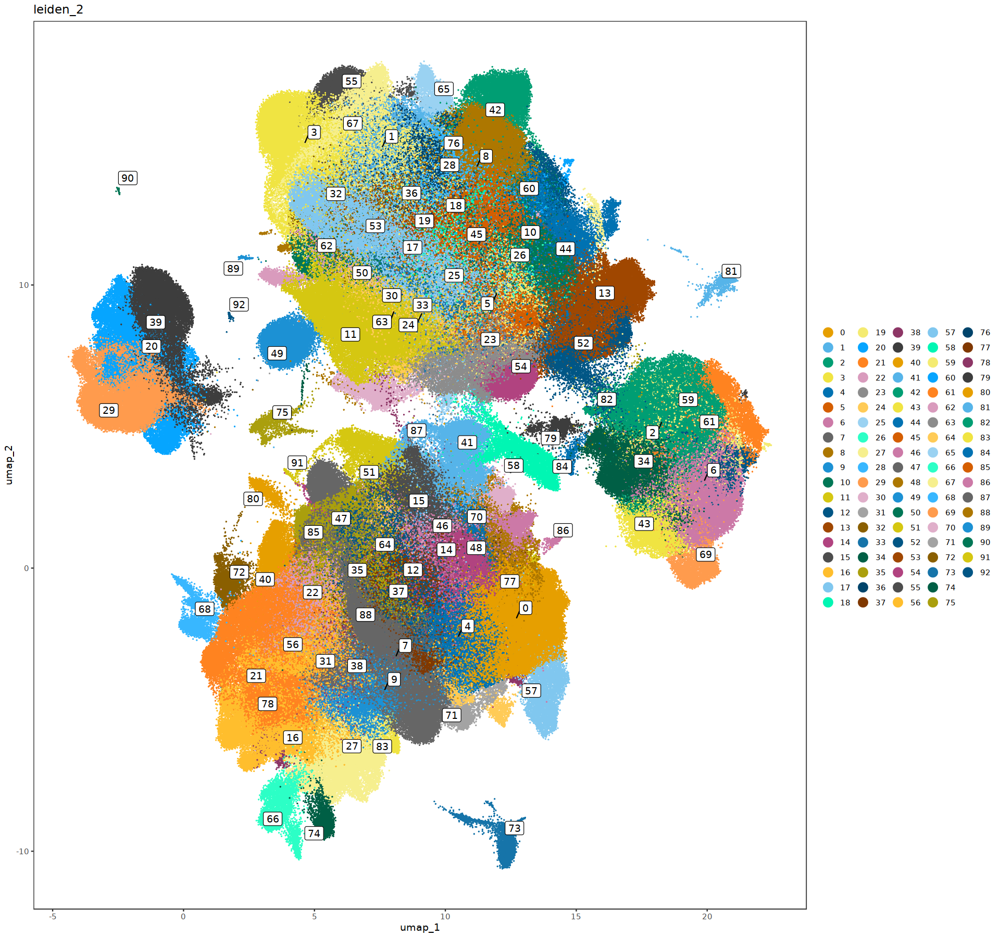

In [ ]:
options(repr.plot.height = 15, repr.plot.width = 16)
dittoDimPlot(gbm, do.raster = TRUE, size = 0.5,
             reduction.use = "umap", var = "leiden_2", 
                       do.label = T, labels.size = 4)

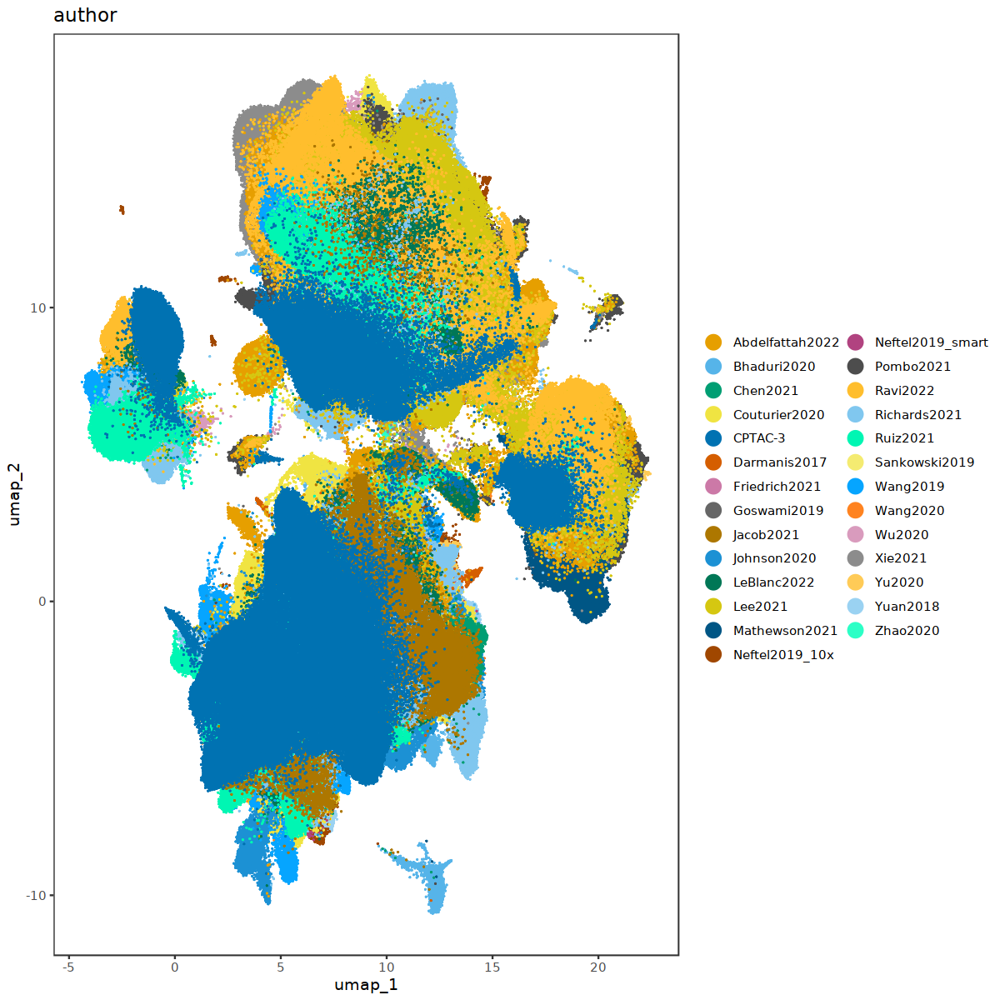

In [ ]:
options(repr.plot.height = 10, repr.plot.width = 10)
dittoDimPlot(gbm, do.raster = TRUE,
             reduction.use = "umap", var = "author", 
             do.label = F, labels.size = 3, size = 0.5)

The expression of marker genes was identified using the Wilcoxon rank-sum test <br>
by comparing all cells within a specific cluster to all cells outside said cluster. <br>
We could identify a population of cells with a clear neutrophil signature <br>
in addiiton to differences between predicted TAM-MG from the queried Xie2021 dataset <br> 
and the TAM-MG from the core GBmap reference.

### Identification of neutrophil population

In [ ]:
gbm <- NormalizeData(gbm)%>%FindVariableFeatures()%>%
        ScaleData()%>%RunPCA()%>%FindNeighbors(dims = 1:30) %>%
        FindClusters(resolution = 1)

Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


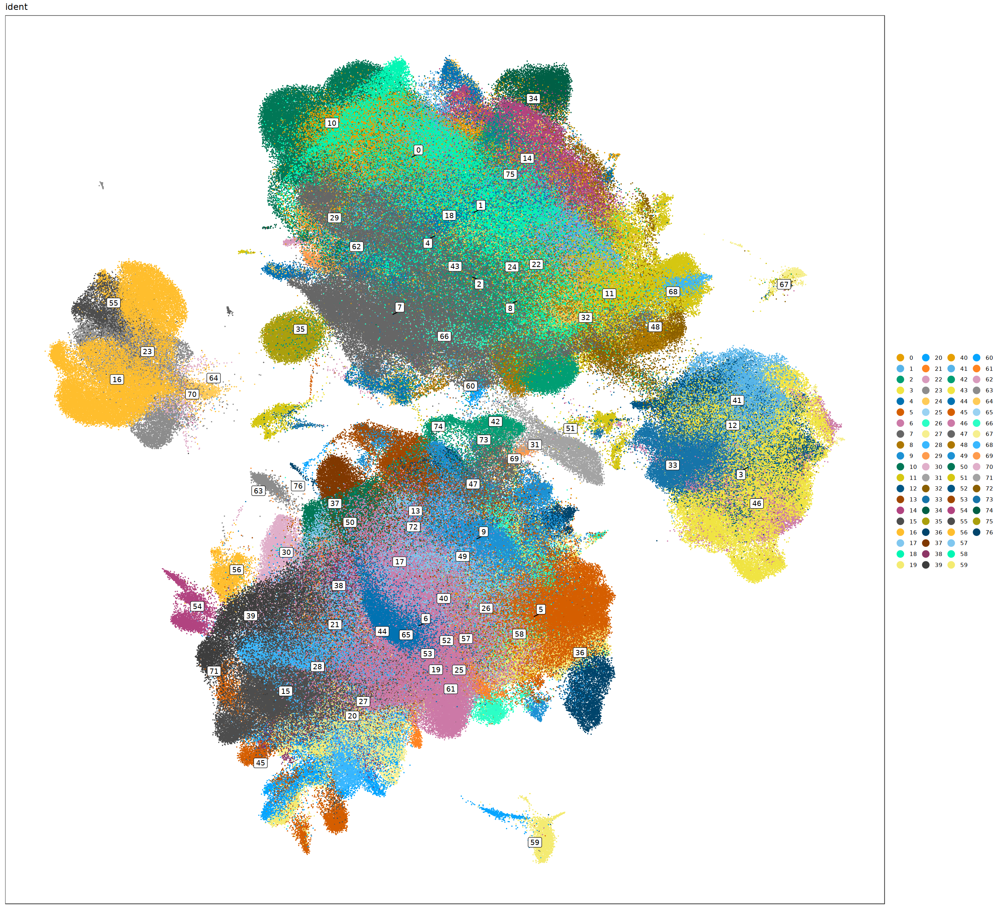

In [ ]:
options(repr.plot.height = 20, repr.plot.width = 22)

dittoDimPlot(gbm, do.label = T, labels.size = 4,
             reduction.use = "umap", var = 'ident', 
            do.raster = TRUE,
            size = 0.5) + NoAxes() 

In [ ]:
markers <- FindAllMarkers(gbm, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

In [ ]:
# presenece of neutrophil markers
markers <- FindMarkers(gbm, '48', only.pos = TRUE, logfc.threshold = 0.5, min.pct = 0.25)

markers %>% arrange(desc(avg_log2FC))

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CXCL8,0,4.975242,0.947,0.282,0
S100A8,0,4.921024,0.863,0.189,0
IFITM2,0,4.737656,0.875,0.316,0
IL1R2,0,4.650853,0.579,0.034,0
FCGR3B,0,4.543749,0.552,0.009,0
S100A9,0,4.405037,0.911,0.236,0
PELATON,0,4.311203,0.574,0.055,0
FPR2,0,3.974182,0.479,0.026,0
G0S2,0,3.921519,0.847,0.169,0


In [ ]:
saveRDS(gbm, 'data/extended_GBmap.rds')

An object of class Seurat 
5000 features across 1135677 samples within 1 assay 
Active assay: RNA (5000 features, 0 variable features)
 1 dimensional reduction calculated: umap

### Comparing MG between atlas and new studies (Xie2021)

In [ ]:
reference <- readRDS('data/core_GBmap.rds')

mg_atlas <- subset(reference, idents =  'TAM-MG')
mg_new_studies <- subset(gbm, subset =  predicted.high_hierarchy == 'TAM-MG')

mg_atlas$mg <- 'mg_atlas'

In [ ]:
mg <- merge(mg_atlas, y = mg_new_studies, project = "MG", merge.data = T)

In [ ]:
Idents(mg) <- mg@meta.data$mg

markers <- FindMarkers(mg, `ident.1` = 'mg_atlas', `ident.2` = 'mg_new_studies',
                       min.pct = 0.25, logfc.threshold = 0.25)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCDC186,0,-0.4539292,0.116,0.253,0
H1-0,0,-0.6292796,0.255,0.371,0
SAMD9,0,-0.4297673,0.191,0.299,0
XRN1,0,-0.5547679,0.128,0.330,0
RGS10,0,-0.7993242,0.844,0.855,0
ZMAT1,0,-0.5859413,0.084,0.313,0
NLRP1,0,-0.4456227,0.074,0.256,0
IFRD1,0,-0.7966383,0.403,0.549,0
SLC4A7,0,-1.3575216,0.302,0.658,0


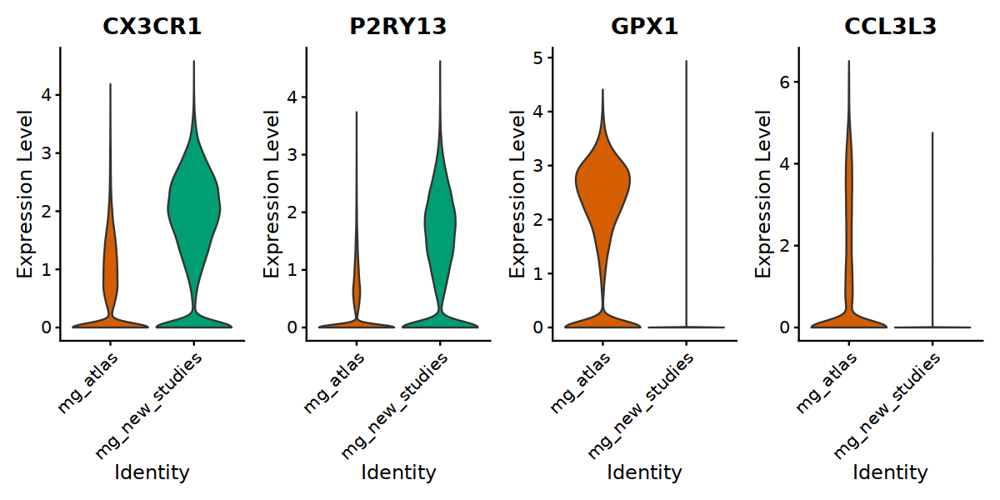

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 10)
VlnPlot(mg, c('CX3CR1', 'P2RY13','GPX1', 'CCL3L3'), split.by = 'mg',
        cols = c('#d55e00', '#009e73'),
        pt.size = 0, split.plot = FALSE, ncol = 4)

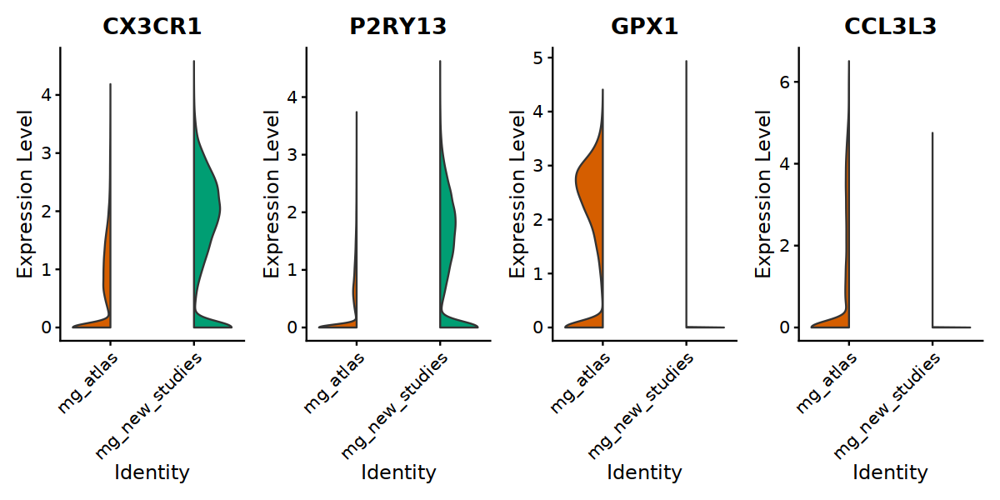

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 10)
VlnPlot(mg, c('CX3CR1', 'P2RY13','GPX1', 'CCL3L3'), split.by = 'mg',
        cols = c('#d55e00', '#009e73'),
        pt.size = 0, split.plot = TRUE, ncol = 4)

In [ ]:
ggsave('figures/marker_genes_mg.pdf', width = 7, height = 4)